<a href="https://colab.research.google.com/github/SSRIRAM07/Deepfake-Forgery-Detection/blob/main/Deepfake_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# to unzip files
# !unzip "/content/drive/MyDrive/deepfake/archive.zip" -d "/content/drive/MyDrive/deepfake/deepfake_images/"

In [ ]:
#Import TensorFlow and TensorFlow Hub into colab
import tensorflow as tf
import tensorflow_hub as hub
print("TensorFlow",tf.__version__)
print("TensorFlow",hub.__version__)

TensorFlow 2.15.0
TensorFlow 0.16.0


In [ ]:
# Check for GPU availability
print("GPU","available (YES)" if tf.config.list_physical_devices("GPU") else "Not available")


GPU available (YES)


In [ ]:
import pandas as pd
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# DeepFake Dataset
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
# DeepFake Dataset
import os


def create_csv_file(image_folder, label, csv_file):
    # Get the list of image filenames in the folder
    image_files = os.listdir(image_folder)

    # Create a DataFrame to store image filenames and labels
    df = pd.DataFrame({'filename': image_files, 'label': label})

    # Save the DataFrame to a CSV file
    csv_file = '/content/drive/MyDrive/deepfake/deepfake_dataset.csv'

    df.to_csv(csv_file, index=False)

if __name__ == "__main__":
    # Replace 'path_to_deepfake_folder' and 'path_to_real_folder' with the actual paths to your image folders
    deepfake_folder = '/content/drive/MyDrive/deepfake/deepfake_images/deepfake_database/train/df'
    # real_folder = '/content/drive/MyDrive/Colab_Notebooks/Deepfake_Detection/deepfake_database/train/real'

    # Replace 'deepfake' and 'real' with the respective labels for each type of image
    deepfake_label = 'deepfake'
    # real_label = 'real'

    # Replace 'output_csv_file.csv' with the desired name of your CSV file
    # csv_file = 'output_csv_file.csv'
    csv_file ='/content/drive/MyDrive/deepfake/deepfake_dataset.csv'

    # Create CSV file for deepfake images
    create_csv_file(deepfake_folder, deepfake_label, csv_file)

    # Create CSV file for real images
    # create_csv_file(real_folder, real_label, csv_file)

    print("CSV file created successfully.")


CSV file created successfully.


In [ ]:
# Real Dataset
import os
import pandas as pd

def create_csv_file(image_folder, label, csv_file):
    # Get the list of image filenames in the folder
    image_files = os.listdir(image_folder)

    # Create a DataFrame to store image filenames and labels
    df = pd.DataFrame({'filename': image_files, 'label': label})
    csv_file = '/content/drive/MyDrive/deepfake/real_dataset.csv'


    # Save the DataFrame to a CSV file
    df.to_csv(csv_file, index=False)

if __name__ == "__main__":
    # Replace 'path_to_deepfake_folder' and 'path_to_real_folder' with the actual paths to your image folders
    # deepfake_folder = '/content/drive/MyDrive/Colab_Notebooks/Deepfake_Detection/deepfake_database/train/df'
    real_folder = '/content/drive/MyDrive/deepfake/deepfake_images/deepfake_database/train/real'

    # Replace 'deepfake' and 'real' with the respective labels for each type of image
    # deepfake_label = 'deepfake'
    real_label = 'real'

    # Replace 'output_csv_file.csv' with the desired name of your CSV file
    # csv_file = 'output_csv_file.csv'
    csv_file = '/content/drive/MyDrive/deepfake/real_dataset.csv'


    # Create CSV file for deepfake images
    # create_csv_file(deepfake_folder, deepfake_label, csv_file)

    # Create CSV file for real images
    create_csv_file(real_folder, real_label, csv_file)

    print("CSV file created successfully.")

CSV file created successfully.


In [ ]:
import pandas as pd
deepfake_data =pd.read_csv("/content/drive/MyDrive/deepfake/deepfake_dataset.csv")
real_data=pd.read_csv("/content/drive/MyDrive/deepfake/real_dataset.csv")
deepfake_data.head()

,filename,label
0,df04175.jpg,deepfake
1,df04359.jpg,deepfake
2,df04285.jpg,deepfake
3,df04149.jpg,deepfake
4,df04500.jpg,deepfake


In [ ]:
deepfake_data.tail()

,filename,label
4933,df00458.jpg,deepfake
4934,df00330.jpg,deepfake
4935,df00900.jpg,deepfake
4936,df00941.jpg,deepfake
4937,df00504.jpg,deepfake


In [ ]:
deepfake_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4938 entries, 0 to 4937
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   filename  4938 non-null   object
 1   label     4938 non-null   object
dtypes: object(2)
memory usage: 77.3+ KB


In [ ]:
deepfake_data.describe()

,filename,label
count,4938,4938
unique,4938,1
top,df04175.jpg,deepfake
freq,1,4938


In [ ]:
real_data.head()

,filename,label
0,real06027.jpg,real
1,real05980.jpg,real
2,real06267.jpg,real
3,real05644.jpg,real
4,real05692.jpg,real


In [ ]:
real_data.tail()

,filename,label
7080,real00419.jpg,real
7081,real00229.jpg,real
7082,real00064.jpg,real
7083,real00242.jpg,real
7084,real00236.jpg,real


In [ ]:
real_data.describe()

,filename,label
count,7085,7085
unique,7085,1
top,real06027.jpg,real
freq,1,7085


In [ ]:
import os
import pandas as pd

def create_dataframe(image_folder, label):
    # Get the list of image file paths in the folder
    image_files = os.listdir(image_folder)
    image_paths = [os.path.join(image_folder, file) for file in image_files]

    # Create a list of image names by extracting the filename without the directory path and extension
    image_names = [os.path.splitext(os.path.basename(path))[0] for path in image_paths]

    # Create a list of corresponding labels
    labels = [label] * len(image_paths)

    # Create a DataFrame with 'filename', 'image_name', and 'label' columns
    df = pd.DataFrame({'filepath': image_paths, 'image_name': image_names, 'label': labels})

    return df

if __name__ == "__main__":
    # Replace 'path_to_real_folder' and 'path_to_fake_folder' with the actual paths to your image folders
    real_folder = '/content/drive/MyDrive/deepfake/deepfake_images/deepfake_database/train/real'
    fake_folder = '/content/drive/MyDrive/deepfake/deepfake_images/deepfake_database/train/df'

    # Replace 'real' and 'fake' with the respective labels for each type of image
    real_label = 'real'
    fake_label = 'deepfake'

    # Create DataFrames for real and fake images
    real_df = create_dataframe(real_folder, real_label)
    fake_df = create_dataframe(fake_folder, fake_label)

    # Concatenate the two DataFrames to create the final combined dataset
    combined_df = pd.concat([real_df, fake_df], ignore_index=True)

    # Optionally, shuffle the dataset
    combined_df = combined_df.sample(frac=1).reset_index(drop=True)

    # Display the first few rows of the combined DataFrame
    print(combined_df.head())

    # Optionally, save the DataFrame to a new CSV file
    combined_df.to_csv('/content/drive/MyDrive/deepfake/combined_dataset.csv', index=False)

                                            filepath image_name     label
0  /content/drive/MyDrive/deepfake/deepfake_image...  real03392      real
1  /content/drive/MyDrive/deepfake/deepfake_image...  real00325      real
2  /content/drive/MyDrive/deepfake/deepfake_image...    df03800  deepfake
3  /content/drive/MyDrive/deepfake/deepfake_image...    df03626  deepfake
4  /content/drive/MyDrive/deepfake/deepfake_image...    df02754  deepfake


In [ ]:
com=pd.read_csv("/content/drive/MyDrive/deepfake/combined_dataset.csv")
com.head()

,filepath,image_name,label
0,/content/drive/MyDrive/deepfake/deepfake_image...,real03392,real
1,/content/drive/MyDrive/deepfake/deepfake_image...,real00325,real
2,/content/drive/MyDrive/deepfake/deepfake_image...,df03800,deepfake
3,/content/drive/MyDrive/deepfake/deepfake_image...,df03626,deepfake
4,/content/drive/MyDrive/deepfake/deepfake_image...,df02754,deepfake


In [ ]:
com.tail()

,filepath,image_name,label
12018,/content/drive/MyDrive/deepfake/deepfake_image...,df04676,deepfake
12019,/content/drive/MyDrive/deepfake/deepfake_image...,df00280,deepfake
12020,/content/drive/MyDrive/deepfake/deepfake_image...,real01515,real
12021,/content/drive/MyDrive/deepfake/deepfake_image...,real04899,real
12022,/content/drive/MyDrive/deepfake/deepfake_image...,real01038,real


In [ ]:
com.describe()

,filepath,image_name,label
count,12023,12023,12023
unique,12023,12023,2
top,/content/drive/MyDrive/deepfake/deepfake_image...,real03392,real
freq,1,1,7085


In [ ]:
com.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12023 entries, 0 to 12022
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   filepath    12023 non-null  object
 1   image_name  12023 non-null  object
 2   label       12023 non-null  object
dtypes: object(3)
memory usage: 281.9+ KB


In [ ]:
import os
import pandas as pd

def create_dataframe(image_folder, label):
    # Get the list of image file paths in the folder
    image_files = os.listdir(image_folder)
    image_paths = [os.path.join(image_folder, file) for file in image_files]

    # Create a list of image names by extracting the filename without the directory path and extension
    image_names = [os.path.splitext(os.path.basename(path))[0] for path in image_paths]

    # Create a list of corresponding labels
    labels = [label] * len(image_paths)

    # Create a DataFrame with 'filename', 'image_name', 'label', and 'file_path' columns
    df = pd.DataFrame({'filename': image_files, 'image_name': image_names, 'label': labels, 'file_path': image_paths})

    return df

if __name__ == "__main__":
    # Replace 'path_to_real_folder' and 'path_to_deepfake_folder' with the actual paths to your image folders
    real_folder = '/content/drive/MyDrive/deepfake/deepfake_images/deepfake_database/train/real'
    deepfake_folder = '/content/drive/MyDrive/deepfake/deepfake_images/deepfake_database/train/df'

    # Replace 'real' and 'deepfake' with the respective labels for each type of image
    real_label = 'real'
    deepfake_label = 'deepfake'

    # Create DataFrames for real and deepfake images
    real_df = create_dataframe(real_folder, real_label)
    deepfake_df = create_dataframe(deepfake_folder, deepfake_label)
    combined_df.to_csv('real_df.csv', index=False)


    # Concatenate the two DataFrames to create the final combined dataset
    combined_df = pd.concat([real_df, deepfake_df], ignore_index=True)

    # Optionally, shuffle the dataset
    combined_df = combined_df.sample(frac=1).reset_index(drop=True)

    # Display the first few rows of the combined DataFrame
    print(combined_df.head())

    # Optionally, save the DataFrame to a new CSV file
    combined_df.to_csv('/content/drive/MyDrive/deepfake/combined_dataset.csv', index=False)


        filename image_name     label  \
0  real00729.jpg  real00729      real   
1    df04883.jpg    df04883  deepfake   
2  real00616.jpg  real00616      real   
3    df04112.jpg    df04112  deepfake   
4  real01407.jpg  real01407      real   

                                           file_path  
0  /content/drive/MyDrive/deepfake/deepfake_image...  
1  /content/drive/MyDrive/deepfake/deepfake_image...  
2  /content/drive/MyDrive/deepfake/deepfake_image...  
3  /content/drive/MyDrive/deepfake/deepfake_image...  
4  /content/drive/MyDrive/deepfake/deepfake_image...  


In [ ]:
both =pd.read_csv('/content/drive/MyDrive/deepfake/combined_dataset.csv')
both.head()

,filename,image_name,label,file_path
0,real00729.jpg,real00729,real,/content/drive/MyDrive/deepfake/deepfake_image...
1,df04883.jpg,df04883,deepfake,/content/drive/MyDrive/deepfake/deepfake_image...
2,real00616.jpg,real00616,real,/content/drive/MyDrive/deepfake/deepfake_image...
3,df04112.jpg,df04112,deepfake,/content/drive/MyDrive/deepfake/deepfake_image...
4,real01407.jpg,real01407,real,/content/drive/MyDrive/deepfake/deepfake_image...


In [ ]:
both.tail()

,filename,image_name,label,file_path
12018,real01063.jpg,real01063,real,/content/drive/MyDrive/deepfake/deepfake_image...
12019,df01925.jpg,df01925,deepfake,/content/drive/MyDrive/deepfake/deepfake_image...
12020,df02285.jpg,df02285,deepfake,/content/drive/MyDrive/deepfake/deepfake_image...
12021,df03138.jpg,df03138,deepfake,/content/drive/MyDrive/deepfake/deepfake_image...
12022,df02224.jpg,df02224,deepfake,/content/drive/MyDrive/deepfake/deepfake_image...


In [ ]:
both.describe()

,filename,image_name,label,file_path
count,12023,12023,12023,12023
unique,12023,12023,2,12023
top,real00729.jpg,real00729,real,/content/drive/MyDrive/deepfake/deepfake_image...
freq,1,1,7085,1


In [ ]:
both.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12023 entries, 0 to 12022
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   filename    12023 non-null  object
 1   image_name  12023 non-null  object
 2   label       12023 non-null  object
 3   file_path   12023 non-null  object
dtypes: object(4)
memory usage: 375.8+ KB


In [ ]:
both['label'].value_counts()

real        7085
deepfake    4938
Name: label, dtype: int64

<Axes: >

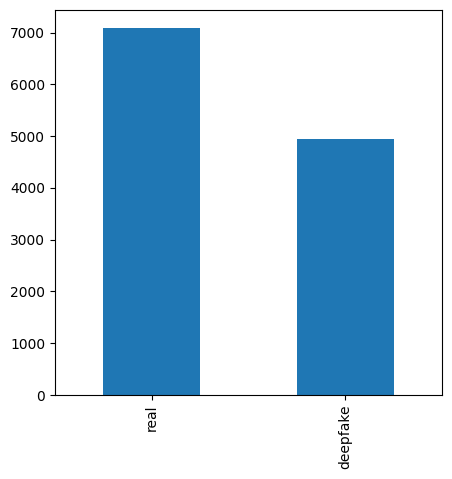

In [ ]:
both['label'].value_counts().plot.bar(figsize=(5,5))

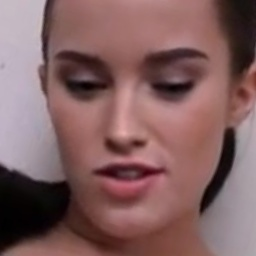

In [ ]:
from IPython.display import Image
Image("/content/drive/MyDrive/deepfake/deepfake_images/deepfake_database/train/df/df04391.jpg")

In [ ]:
import os
import pandas as pd

def create_dataframe(image_folder, label):
    # Get the list of image file paths in the folder
    image_files = os.listdir(image_folder)
    image_paths = [os.path.join(image_folder, file) for file in image_files]

    # Create a list of image names by extracting the filename without the directory path and extension
    image_names = [os.path.splitext(os.path.basename(path))[0] for path in image_paths]

    # Create a list of corresponding labels
    labels = [label] * len(image_paths)

    # Create a DataFrame with 'filename', 'image_name', 'label', 'binary_label', and 'file_path' columns
    df = pd.DataFrame({'filename': image_files, 'image_name': image_names, 'label': labels, 'file_path': image_paths})

    return df

if __name__ == "__main__":
    # Replace 'path_to_real_folder' and 'path_to_deepfake_folder' with the actual paths to your image folders
    real_folder = '/content/drive/MyDrive/deepfake/deepfake_images/deepfake_database/train/real'
    deepfake_folder = '/content/drive/MyDrive/deepfake/deepfake_images/deepfake_database/train/df'

    # Create DataFrames for real and deepfake images
    real_df = create_dataframe(real_folder, 'real')
    deepfake_df = create_dataframe(deepfake_folder, 'deepfake')

    # Combine the DataFrames for real and deepfake images
    combined_df = pd.concat([real_df, deepfake_df], ignore_index=True)

    # Create a binary label column where 'real' is labeled as 0 and 'deepfake' is labeled as 1
    combined_df['binary_label'] = combined_df['label'].apply(lambda x: 0 if x == 'real' else 1)

    # Optionally, shuffle the dataset
    combined_df = combined_df.sample(frac=1).reset_index(drop=True)

    # Display the first few rows of the combined DataFrame
    print(combined_df.head())

    # Save the combined DataFrame to a CSV file
    combined_df.to_csv('/content/drive/MyDrive/deepfake/both_Label_dataset.csv.csv', index=False)


        filename image_name     label  \
0  real04152.jpg  real04152      real   
1    df03056.jpg    df03056  deepfake   
2  real05914.jpg  real05914      real   
3  real04147.jpg  real04147      real   
4    df02693.jpg    df02693  deepfake   

                                           file_path  binary_label  
0  /content/drive/MyDrive/deepfake/deepfake_image...             0  
1  /content/drive/MyDrive/deepfake/deepfake_image...             1  
2  /content/drive/MyDrive/deepfake/deepfake_image...             0  
3  /content/drive/MyDrive/deepfake/deepfake_image...             0  
4  /content/drive/MyDrive/deepfake/deepfake_image...             1  


In [ ]:
both_lab=pd.read_csv("/content/drive/MyDrive/deepfake/both_Label_dataset.csv.csv")
both_lab.head()

,filename,image_name,label,file_path,binary_label
0,real04152.jpg,real04152,real,/content/drive/MyDrive/deepfake/deepfake_image...,0
1,df03056.jpg,df03056,deepfake,/content/drive/MyDrive/deepfake/deepfake_image...,1
2,real05914.jpg,real05914,real,/content/drive/MyDrive/deepfake/deepfake_image...,0
3,real04147.jpg,real04147,real,/content/drive/MyDrive/deepfake/deepfake_image...,0
4,df02693.jpg,df02693,deepfake,/content/drive/MyDrive/deepfake/deepfake_image...,1


In [ ]:
both_lab.tail()

,filename,image_name,label,file_path,binary_label
12018,df01040.jpg,df01040,deepfake,/content/drive/MyDrive/deepfake/deepfake_image...,1
12019,real01091.jpg,real01091,real,/content/drive/MyDrive/deepfake/deepfake_image...,0
12020,df00081.jpg,df00081,deepfake,/content/drive/MyDrive/deepfake/deepfake_image...,1
12021,real02128.jpg,real02128,real,/content/drive/MyDrive/deepfake/deepfake_image...,0
12022,real06436.jpg,real06436,real,/content/drive/MyDrive/deepfake/deepfake_image...,0


In [ ]:
import numpy as np
labels=both_lab['label']
labels=np.array(labels)
labels

array(['real', 'deepfake', 'real', ..., 'deepfake', 'real', 'real'],
      dtype=object)

In [ ]:
len(labels)

12023

In [ ]:
unique_labels=np.unique(labels)
unique_labels

array(['deepfake', 'real'], dtype=object)

In [ ]:
len(unique_labels)

2

In [ ]:
print(labels[0])
labels[0]==unique_labels

real


array([False,  True])

In [ ]:
boolean_labels=[label==unique_labels for label in labels]
boolean_labels

[array([False,  True]),
 array([ True, False]),
 array([False,  True]),
 array([False,  True]),
 array([ True, False]),
 array([False,  True]),
 array([ True, False]),
 array([False,  True]),
 array([False,  True]),
 array([False,  True]),
 array([False,  True]),
 array([False,  True]),
 array([False,  True]),
 array([False,  True]),
 array([False,  True]),
 array([False,  True]),
 array([ True, False]),
 array([False,  True]),
 array([ True, False]),
 array([False,  True]),
 array([False,  True]),
 array([False,  True]),
 array([False,  True]),
 array([ True, False]),
 array([ True, False]),
 array([ True, False]),
 array([False,  True]),
 array([ True, False]),
 array([False,  True]),
 array([False,  True]),
 array([False,  True]),
 array([False,  True]),
 array([ True, False]),
 array([ True, False]),
 array([False,  True]),
 array([ True, False]),
 array([False,  True]),
 array([False,  True]),
 array([False,  True]),
 array([ True, False]),
 array([ True, False]),
 array([False,  

In [ ]:
len(boolean_labels)

12023

In [ ]:
print(labels[0])
print(np.where(unique_labels == labels[0]))
print(boolean_labels[0].astype(int))
print(boolean_labels[2].astype(int))
boolean_labels= np.array(boolean_labels).astype('int')
boolean_labels

real
(array([1]),)
[0 1]
[0 1]


array([[0, 1],
       [1, 0],
       [0, 1],
       ...,
       [1, 0],
       [0, 1],
       [0, 1]])

In [ ]:
# Creating Validation set fot the dataset
# setup x and y variable
x=both_lab['file_path'].values
y=boolean_labels
x,len(x),y,len(y)

(array(['/content/drive/MyDrive/deepfake/deepfake_images/deepfake_database/train/real/real04152.jpg',
        '/content/drive/MyDrive/deepfake/deepfake_images/deepfake_database/train/df/df03056.jpg',
        '/content/drive/MyDrive/deepfake/deepfake_images/deepfake_database/train/real/real05914.jpg',
        ...,
        '/content/drive/MyDrive/deepfake/deepfake_images/deepfake_database/train/df/df00081.jpg',
        '/content/drive/MyDrive/deepfake/deepfake_images/deepfake_database/train/real/real02128.jpg',
        '/content/drive/MyDrive/deepfake/deepfake_images/deepfake_database/train/real/real06436.jpg'],
       dtype=object),
 12023,
 array([[0, 1],
        [1, 0],
        [0, 1],
        ...,
        [1, 0],
        [0, 1],
        [0, 1]]),
 12023)

In [ ]:
#Setup number of images for experimentation
num_images =1000 #@param {type:'slider', min:1000,max:10000,step:100}

In [ ]:
#Split the data for training
from sklearn.model_selection import train_test_split

#split the data into training and validation of total images
x_train,x_val,y_train,y_val =train_test_split(x[:num_images],
                                              y[:num_images],
                                              test_size=0.2,
                                              random_state=45)
len(x_train),len(y_train),len(x_val),len(y_val)

(800, 800, 200, 200)

In [ ]:
x_train[:3],y_train[:3]

(array(['/content/drive/MyDrive/deepfake/deepfake_images/deepfake_database/train/real/real05646.jpg',
        '/content/drive/MyDrive/deepfake/deepfake_images/deepfake_database/train/real/real02413.jpg',
        '/content/drive/MyDrive/deepfake/deepfake_images/deepfake_database/train/real/real04907.jpg'],
       dtype=object),
 array([[0, 1],
        [0, 1],
        [0, 1]]))

In [ ]:
# First Convert Images to Numpy array
from matplotlib.pyplot import imread
image=imread(x[8])
image

array([[[ 15,   2,  19],
        [ 14,   1,  18],
        [ 17,   4,  22],
        ...,
        [ 94,  50,  47],
        [ 93,  49,  46],
        [ 93,  49,  46]],

       [[ 16,   2,  19],
        [ 16,   3,  20],
        [ 21,   7,  24],
        ...,
        [ 93,  49,  46],
        [ 93,  49,  46],
        [ 92,  48,  45]],

       [[ 14,   0,  13],
        [ 15,   1,  16],
        [ 24,   7,  23],
        ...,
        [ 81,  38,  32],
        [ 80,  37,  31],
        [ 80,  37,  31]],

       ...,

       [[245, 175, 163],
        [248, 178, 166],
        [250, 181, 166],
        ...,
        [249, 153, 131],
        [249, 153, 131],
        [249, 153, 131]],

       [[243, 172, 154],
        [245, 174, 156],
        [246, 175, 157],
        ...,
        [249, 153, 131],
        [249, 153, 131],
        [249, 153, 131]],

       [[239, 166, 147],
        [241, 168, 149],
        [243, 170, 151],
        ...,
        [249, 153, 131],
        [249, 153, 131],
        [249, 153, 131]]

In [ ]:
image.shape

(216, 216, 3)

In [ ]:
# Creating a function to convert image to tensor

img_size =224

def process_image(image_path):
  # Take the image path and turn it into tensors
  # Read the image file using image path
  image =tf.io.read_file(image_path)
  # turn jpg image into numerical tensors with 3 color channels
  image=tf.image.decode_jpeg(image,channels=3)
  # convert color channel values from 1-255 to 0-1 values
  image =tf.image.convert_image_dtype(image,tf.float32)
  # resize the image to our desired value(244,244)
  image=tf.image.resize(image,size=[img_size,img_size])

  return image

In [ ]:
# create a functin to return a tuple(image,label)
def get_image_label(image_path,label):
  image =process_image(image_path)
  return image,label

In [ ]:
x[45],y[45]

('/content/drive/MyDrive/deepfake/deepfake_images/deepfake_database/train/real/real06969.jpg',
 array([0, 1]))

In [ ]:
# Demo for above
(process_image(x[45]),tf.constant(y[45]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.4669668 , 0.46304524, 0.49385756],
         [0.46346542, 0.45786318, 0.48223293],
         [0.4502201 , 0.43985596, 0.46450582],
         ...,
         [0.57384956, 0.63771516, 0.7097039 ],
         [0.57276917, 0.6425171 , 0.71926785],
         [0.57334936, 0.6439376 , 0.72236896]],
 
        [[0.4761305 , 0.47220892, 0.50302124],
         [0.47330937, 0.46770713, 0.49207687],
         [0.44981995, 0.4394558 , 0.46410567],
         ...,
         [0.5717087 , 0.6355743 , 0.70756304],
         [0.57611054, 0.64585847, 0.7226092 ],
         [0.58615464, 0.6567429 , 0.73517424]],
 
        [[0.48187277, 0.4779512 , 0.5087635 ],
         [0.47226894, 0.4666667 , 0.49103644],
         [0.44023612, 0.42987198, 0.45452183],
         ...,
         [0.5704282 , 0.63429385, 0.7062826 ],
         [0.5806724 , 0.6504203 , 0.72717106],
         [0.5977594 , 0.66834766, 0.746779  ]],
 
        ...,
 
        [[0.05472189, 0.06256503

In [ ]:
# Turn all our data into batches of size 32 for both x and y
batch_size=32

# Now create a function to turn data into batches
def create_data_batches(x,y=None,batch_size=batch_size,valid_data=False,test_data=False):
  # if data is test dataset, we don't have labels
  if test_data:
    print("Creating test data batches...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x))) #only file path (no labels)
    data_batch =data.map(process_image).batch(batch_size)
    return data_batch

  # if the data is valid dataset ,we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),tf.constant(y))) #filepath and labels
    data_batch =data.map(get_image_label).batch(batch_size)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into tensors
    data =tf.data.Dataset.from_tensor_slices((tf.constant(x),tf.constant(y)))
    # Shuffling the pathnames and labels before mapping the image processor function is faster than shuffling images
    data =data.shuffle(buffer_size=len(x))
    # Create (image,label) tuple ,This also turns image path into preprocessed images
    data =data.map(get_image_label)
    # Turn the training data into batches
    data_batch =data.batch(batch_size)
    return data_batch

In [ ]:
# Creating training and validation data batches using previously build function with parameters
train_data = create_data_batches(x_train,y_train)
val_data =create_data_batches(x_val,y_val,valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
import matplotlib.pyplot as plt

# Creating a function for viewing image in data batches

def show_25_images(images,labels):
  plt.figure(figsize=(15,15))
  # Loop throught 25 images
  for i in range(25):
    ax=plt.subplot(5,5,i+1)
    # Display images
    plt.imshow(images[i])
    # Add image label as title
    plt.title(unique_labels[labels[i].argmax()])
    # Turn the grid line off
    plt.axis("off")

In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 2), dtype=tf.int64, name=None))>

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 2), dtype=tf.int64, name=None))>

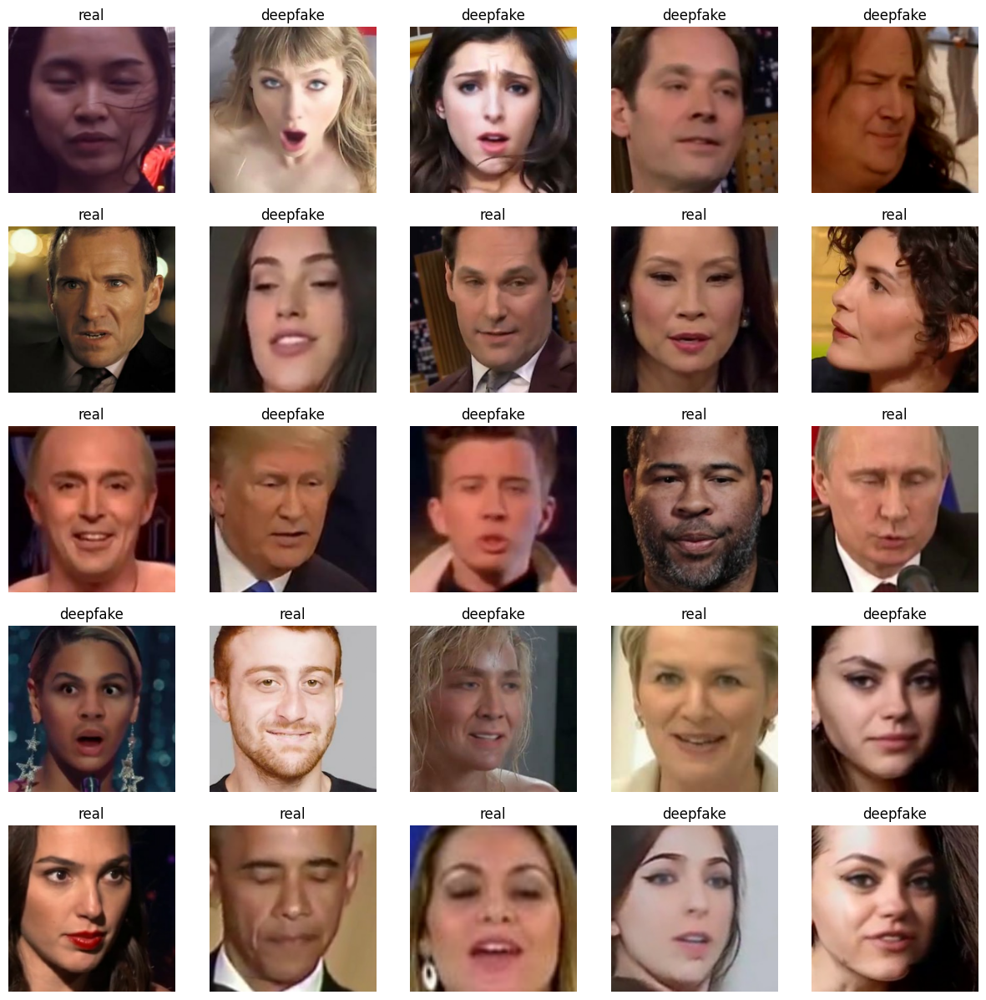

In [ ]:
# Visualize on Training data
train_images,train_labels =next(train_data.as_numpy_iterator())
show_25_images(train_images,train_labels)

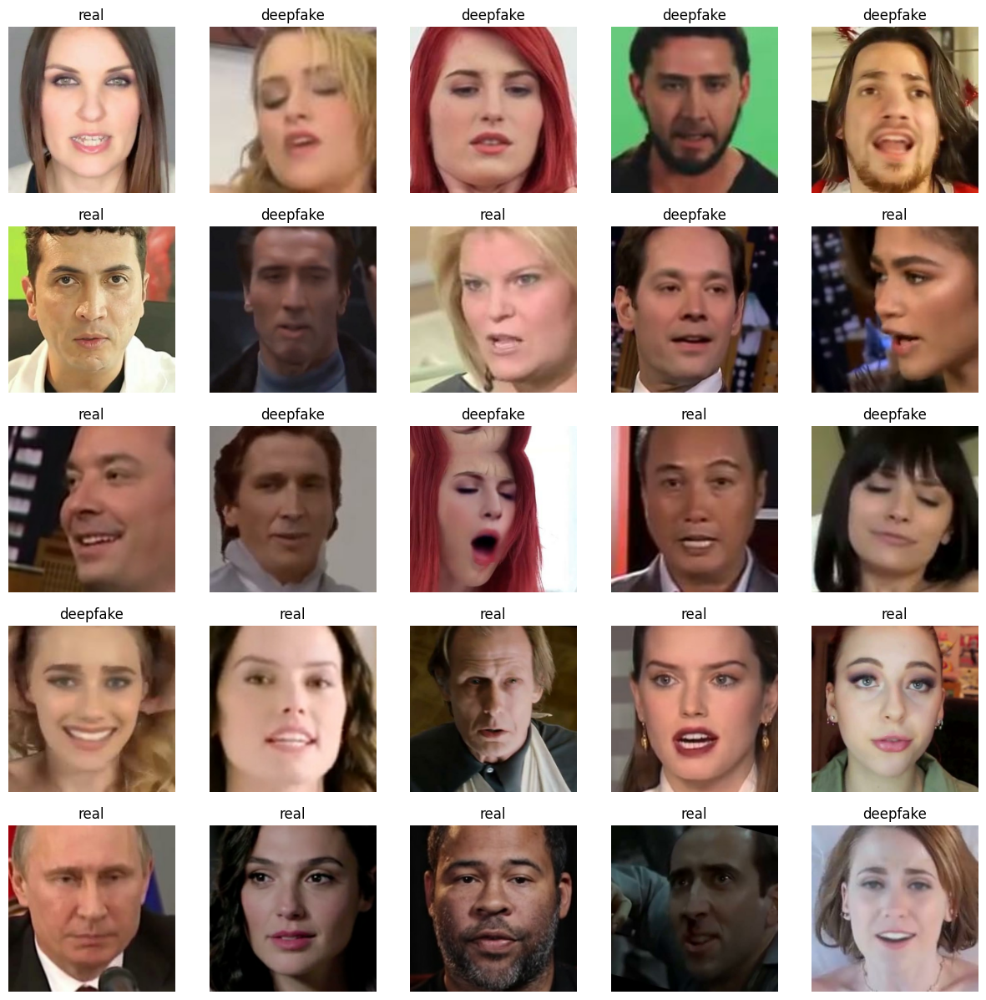

In [ ]:
# Visualize on validatation data
val_images,val_labels=next(val_data.as_numpy_iterator())
show_25_images(val_images,val_labels)

In [ ]:
# setup input shspe to our model same as that of trained model

input_shape=[None,img_size,img_size,3] #batch,height,width,color channel

# setup output shape to our model
output_shape=len(unique_labels)

#setup model url from tensorflow hub
model_url ="https://tfhub.dev/tensorflow/resnet_50/classification/1"

In [ ]:
# create a function which builds a keras model
def create_model(input_shape=input_shape,output_shape=output_shape,model_url=model_url):
  print("Building model with:",model_url)

  # setup model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(model_url), #layer 1 (input layer)
      tf.keras.layers.Dense(units=output_shape,
                            activation="softmax") # layer 2 (output layer)
  ])

  # compile the model

  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # build the model
  model.build(input_shape)

  return model

In [ ]:
model =create_model()
model.summary()

Building model with: https://tfhub.dev/tensorflow/resnet_50/classification/1
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              25612201  
                                                                 
 dense (Dense)               (None, 2)                 2004      
                                                                 
Total params: 25614205 (97.71 MB)
Trainable params: 2004 (7.83 KB)
Non-trainable params: 25612201 (97.70 MB)
_________________________________________________________________


In [ ]:
# Callback using TensorBoard

# Load TensorBoard notebook extention
%load_ext tensorboard

In [ ]:
import datetime
import os

# Creating a function to call tensorboard callback

def create_tensorboard_callback():
  # create log directory for storing tensorboard log data
  logdir = os.path.join('/content/drive/MyDrive/deepfake/tensorboard_logs',
                        # Making it log datatime to keep track
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

In [ ]:
# Early stopping callback ,stops our model from overfitting

early_stopping =tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                 patience=3)

In [ ]:
num_epochs=100 #@param {type:'slider',min:10,max:100,step:10}

In [ ]:
# Check GPU availability
print("GPU available" if tf.config.list_physical_devices("GPU") else "Not Available")

GPU available


In [ ]:
# Create a function that trains a model
def train_model():

  # create a model
  model=create_model()

  # Create new tensorboard session everytime we train model
  tensorboard = create_tensorboard_callback()

  # Fit the model
  model.fit(x=train_data,
            epochs=num_epochs,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard,early_stopping])

  # Return the fitted model
  return model

In [ ]:
# Fit the model to data
model = train_model()

Building model with: https://tfhub.dev/tensorflow/resnet_50/classification/1
Epoch 1/100
25/25 [==============================] - 184s 6s/step - loss: 0.6906 - accuracy: 0.5250 - val_loss: 0.6851 - val_accuracy: 0.6500
Epoch 2/100
25/25 [==============================] - 4s 167ms/step - loss: 0.6842 - accuracy: 0.5913 - val_loss: 0.6783 - val_accuracy: 0.6700
Epoch 3/100
25/25 [==============================] - 4s 160ms/step - loss: 0.6787 - accuracy: 0.5913 - val_loss: 0.6713 - val_accuracy: 0.6600
Epoch 4/100
25/25 [==============================] - 4s 160ms/step - loss: 0.6737 - accuracy: 0.5913 - val_loss: 0.6655 - val_accuracy: 0.6600
Epoch 5/100
25/25 [==============================] - 5s 186ms/step - loss: 0.6691 - accuracy: 0.5938 - val_loss: 0.6602 - val_accuracy: 0.6600


In [ ]:
# Checking the tensorboard logs
import tensorboard
%tensorboard --logdir="/content/drive/MyDrive/deepfake/tensorboard_logs"

<IPython.core.display.Javascript object>

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 2), dtype=tf.int64, name=None))>

In [ ]:
# Make prediction on validation data(Not used to train)
predictions = model.predict(val_data)
predictions

7/7 [==============================] - 1s 107ms/step


array([[0.45317227, 0.54682773],
       [0.4788884 , 0.5211116 ],
       [0.49221918, 0.5077808 ],
       [0.44853172, 0.5514683 ],
       [0.45103404, 0.54896593],
       [0.43334165, 0.5666583 ],
       [0.4556471 , 0.5443528 ],
       [0.45192933, 0.54807067],
       [0.42141694, 0.57858306],
       [0.45488057, 0.54511946],
       [0.43332082, 0.5666792 ],
       [0.43417004, 0.56583   ],
       [0.49419525, 0.5058048 ],
       [0.4188993 , 0.5811007 ],
       [0.48563376, 0.5143662 ],
       [0.4901005 , 0.50989956],
       [0.46327952, 0.5367205 ],
       [0.44156343, 0.5584366 ],
       [0.44456136, 0.5554386 ],
       [0.4574729 , 0.5425271 ],
       [0.4147098 , 0.5852902 ],
       [0.47126392, 0.5287361 ],
       [0.43744773, 0.5625522 ],
       [0.46562198, 0.53437805],
       [0.49483183, 0.5051682 ],
       [0.47780356, 0.5221964 ],
       [0.42730096, 0.572699  ],
       [0.4719762 , 0.5280238 ],
       [0.47321355, 0.52678645],
       [0.48397577, 0.51602423],
       [0.

In [ ]:
predictions[0],len(predictions[0]),len(predictions)

(array([0.45317227, 0.54682773], dtype=float32), 2, 200)

In [ ]:
predictions.shape

(200, 2)

In [ ]:
np.sum(predictions[0])

1.0

In [ ]:
len(y_val)

200

In [ ]:
len(unique_labels)

2

In [ ]:
# Let's see the predictions
index=7
print(predictions[index])
print(f"Max value (probability of prediction - proba): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Predicted label: {unique_labels[np.argmax(predictions[index])]}")

[0.45192933 0.54807067]
Max value (probability of prediction - proba): 0.5480706691741943
Sum: 1.0
Predicted label: real


In [ ]:
# Turn prediction probability into their respective label

def get_pred_label(prediction_probabilities):
  return unique_labels[np.argmax(prediction_probabilities)]

In [ ]:
# get a predicted label based on array of prediction probabilities
pred_label =get_pred_label(predictions[81])
pred_label

'real'

In [ ]:
images_=[]
labels_=[]

# Loop through unbatched data
for image ,label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)
  # print(image,label)
images_[1],labels_[1]

(array([[[0.4156863 , 0.2784314 , 0.2627451 ],
         [0.4156863 , 0.2784314 , 0.2627451 ],
         [0.4156863 , 0.2784314 , 0.2627451 ],
         ...,
         [0.6946604 , 0.60446435, 0.6358369 ],
         [0.69679624, 0.60660017, 0.6379727 ],
         [0.69803923, 0.60784316, 0.6392157 ]],
 
        [[0.4169293 , 0.27967438, 0.2639881 ],
         [0.4169293 , 0.27967438, 0.2639881 ],
         [0.4169293 , 0.27967438, 0.2639881 ],
         ...,
         [0.6795724 , 0.58937633, 0.6182629 ],
         [0.6810313 , 0.5908352 , 0.6197218 ],
         [0.6818803 , 0.5916842 , 0.6205708 ]],
 
        [[0.41906515, 0.28181022, 0.26612395],
         [0.41906515, 0.28181022, 0.26612395],
         [0.41906515, 0.28181022, 0.26612395],
         ...,
         [0.6536466 , 0.5634505 , 0.5880653 ],
         [0.65394217, 0.5637461 , 0.5883609 ],
         [0.6541142 , 0.5639181 , 0.5885329 ]],
 
        ...,
 
        [[0.8497726 , 0.68790275, 0.56917024],
         [0.84960055, 0.6877307 , 0.56899

In [ ]:
# We have unbatched data
len(images_),len(labels_)

(200, 200)

In [ ]:
images_[46],labels_[46]

(array([[[0.06666667, 0.03137255, 0.00320378],
         [0.07958683, 0.03567927, 0.00215336],
         [0.12608545, 0.07151611, 0.02186625],
         ...,
         [0.2516982 , 0.17326681, 0.03601191],
         [0.2587711 , 0.18210794, 0.04838948],
         [0.2737922 , 0.19928241, 0.06987062]],
 
        [[0.06666667, 0.03137255, 0.00320378],
         [0.07958683, 0.03567927, 0.00215336],
         [0.12608545, 0.07151611, 0.02186625],
         ...,
         [0.25490198, 0.1764706 , 0.03921569],
         [0.26294583, 0.18628266, 0.0525642 ],
         [0.27914935, 0.20463955, 0.07522776]],
 
        [[0.06666667, 0.03137255, 0.00320378],
         [0.07958683, 0.03567927, 0.00215336],
         [0.12608545, 0.07151611, 0.02186625],
         ...,
         [0.25490198, 0.1764706 , 0.03921569],
         [0.26536134, 0.18869819, 0.05497972],
         [0.2845065 , 0.20999669, 0.08058491]],
 
        ...,
 
        [[0.09875701, 0.08307073, 0.03628371],
         [0.10196079, 0.08627451, 0.03921

In [ ]:
get_pred_label(labels_[11])

'deepfake'

In [ ]:
get_pred_label(predictions[11])

'real'

In [ ]:
# Create a function to unbatch the batched dataset
def unbatchify(data):
  images=[]
  labels=[]

  # Loop through unbatched data
  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_labels[np.argmax(label)])
    return images,labels

In [ ]:
#Unbatchifying the validation data
val_images,val_labels=unbatchify(val_data)
val_images[0],val_labels[0],len(val_images),len(val_labels)

(array([[[0.57804626, 0.57804626, 0.5858894 ],
         [0.57804626, 0.57804626, 0.5858894 ],
         [0.57804626, 0.57804626, 0.5858894 ],
         ...,
         [0.5764706 , 0.5921569 , 0.5882353 ],
         [0.5764706 , 0.5921569 , 0.5882353 ],
         [0.5764706 , 0.5921569 , 0.5882353 ]],
 
        [[0.57958686, 0.57958686, 0.58743   ],
         [0.57958686, 0.57958686, 0.58743   ],
         [0.57958686, 0.57958686, 0.58743   ],
         ...,
         [0.5764706 , 0.5921569 , 0.5882353 ],
         [0.5764706 , 0.5921569 , 0.5882353 ],
         [0.5764706 , 0.5921569 , 0.5882353 ]],
 
        [[0.57251406, 0.57251406, 0.5803572 ],
         [0.57251406, 0.57251406, 0.5803572 ],
         [0.57251406, 0.57251406, 0.5803572 ],
         ...,
         [0.5764706 , 0.5921569 , 0.5882353 ],
         [0.5764706 , 0.5921569 , 0.5882353 ],
         [0.5764706 , 0.5921569 , 0.5882353 ]],
 
        ...,
 
        [[0.87995124, 0.86426497, 0.82897085],
         [0.89096653, 0.87528026, 0.83998

In [ ]:
get_pred_label(val_labels[0])

'deepfake'

In [ ]:
images_ = []
labels_ = []

# loop through unbatched data
for image ,label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  # labels_.append(label)
  labels_.append(unique_labels[np.argmax(label)])
images_[1],labels_[1]
len(images_),len(labels_)

(200, 200)

In [ ]:
get_pred_label(labels_[9])

'deepfake'

In [ ]:
get_pred_label(predictions[0])

'real'

In [ ]:
def plot_pred(prediction_probabilities,labels,images,n=0):
  pred_prob,true_label,image=prediction_probabilities[n],labels[n],images[n]

  # get pred label
  pred_label =get_pred_label(pred_prob)

  # plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # change the color of title depending on prediction
  if pred_label == true_label:
    color="green"
  else:
    color="red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
            color=color)
pred_label

'real'

In [ ]:
predictions[0]

array([0.45317227, 0.54682773], dtype=float32)

In [ ]:
predictions[0].argsort()

array([0, 1])

In [ ]:
predictions[0][predictions[0].argmax()]

0.54682773

In [ ]:
predictions[0].max()

0.54682773

In [ ]:
unique_labels[predictions[0].argsort()]

array(['deepfake', 'real'], dtype=object)

In [ ]:
# Create a function to visualize top 10 predicted label
def plot_pred_conf(prediction_probabilities,labels,n=1):
  pred_prob,true_label =prediction_probabilities[n],labels[n]

  # get predicted label
  pred_label = get_pred_label(pred_prob)

  # find top 10 predicted indexes
  top_10_pred_indexes =pred_prob.argsort()

  # find top 10 predicted indexes value
  top_10_pred_values =pred_prob[top_10_pred_indexes]

  # find top 10 predicted labels
  top_10_pred_labels = unique_labels[top_10_pred_indexes]

  # setup plot
  top_plot=plt.bar(np.arange(len(top_10_pred_labels)),
                   top_10_pred_values,
                   color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # change color of true label
  if np.isin(true_label , top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

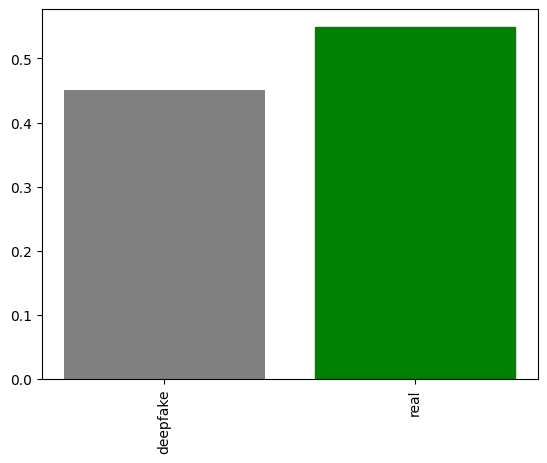

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=labels_,
               n=98)

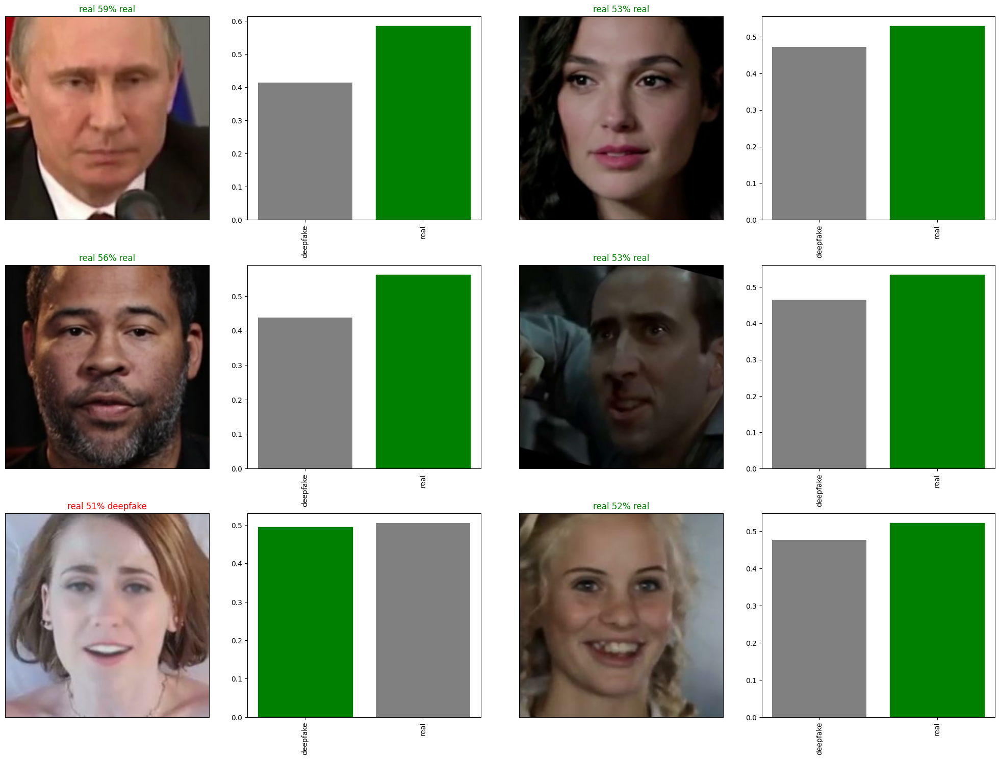

In [ ]:
# lets check few more predictions and their different values
i_multiplier =20
num_rows =3
num_cols =2
num_images =num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows,2*num_cols ,2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=labels_,
            images=images_,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=labels_,
                 n=i+i_multiplier)

plt.tight_layout(h_pad=1.0)
plt.show()

In [ ]:
#Create a function to save the model
# save to model to given directory with suffix filename
def save_model(model,suffix=None):
   # create a model with directory pathname with current time
  modeldir=os.path.join("/content/drive/MyDrive/deepfake/models",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
    # save the model in formet
  model_path=modeldir + "-" + suffix + ".h5"
  print(f"Saving the model to :{model_path}")
  model.save(model_path)

  return model_path

In [ ]:
# Create a function to load our model
def load_model(model_path):
  # load the model from specific path
  print(f"Loading the saved model from :{model_path}")
  model=tf.keras.models.load_model(model_path,custom_objects={"KerasLayer":hub.KerasLayer})

  return model

In [ ]:
#save our model trained on 1000 images
save_model(model,suffix="1000-images-resnet50-Adam")

Saving the model to :/content/drive/MyDrive/deepfake/models/20240201-04511706763119-1000-images-resnet50-Adam.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/drive/MyDrive/deepfake/models/20240201-04511706763119-1000-images-resnet50-Adam.h5'

In [ ]:
# Load our less trained model
load_1000_images_model=load_model("/content/drive/MyDrive/deepfake/models/20240130-06551706597747-1000-images-resnet50-Adam.h5")

Loading the saved model from :/content/drive/MyDrive/deepfake/models/20240130-06551706597747-1000-images-resnet50-Adam.h5


In [ ]:
# Evaluate the pre saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 139ms/step - loss: 0.6602 - accuracy: 0.6600


[0.6602094173431396, 0.6600000262260437]

In [ ]:
#evaluate the loaded model
load_1000_images_model.evaluate(val_data)

7/7 [==============================] - 1s 92ms/step - loss: 0.6644 - accuracy: 0.6350


[0.6644226908683777, 0.6349999904632568]

In [ ]:
# Create a data batch with full dataset
full_data=create_data_batches(x,y)

Creating training data batches...


In [ ]:
full_data


<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 2), dtype=tf.int64, name=None))>

In [ ]:
# Create a model for full data
full_model=create_model()

Building model with: https://tfhub.dev/tensorflow/resnet_50/classification/1


In [ ]:
# Create full model Callbacks
full_model_tensorboard=create_tensorboard_callback()

# No validation set when training on all the data,
#  so we can't monitor validation accuracy
full_model_early_stopping=tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                           patience=3)

In [ ]:
# Fit the full model to full data
full_model.fit(x=full_data,
               epochs=num_epochs,
               callbacks=[full_model_tensorboard,full_model_early_stopping])

Epoch 1/100
234/376 [=================>............] - ETA: 7:40 - loss: 0.6634 - accuracy: 0.6166

In [ ]:
save_model(full_model,suffix="full-image-set-resnet50-Adam-with-early-stop")

In [ ]:
model_with_earlystop=load_model("")

In [ ]:
model_with_earlystop.evaluate(val_data)

In [ ]:
# Fit the full model to full data without callbacks
full_model.fit(x=full_data,
               epochs=num_epochs,
              #  callbacks=[full_model_tensorboard,full_model_early_stopping]
               )

In [ ]:
save_model(full_model,suffix="full-image-set-resnet50-Adam-without-early-stop")

In [ ]:
model_without_earlystop=load_model("")

In [ ]:
model_without_earlystop.evaluate(val_data)

In [ ]:
# Creating new dataset for test images

import os
import pandas as pd

def create_dataframe(image_folder, label):
    # Get the list of image file paths in the folder
    image_files = os.listdir(image_folder)
    image_paths = [os.path.join(image_folder, file) for file in image_files]

    # Create a list of image names by extracting the filename without the directory path and extension
    image_names = [os.path.splitext(os.path.basename(path))[0] for path in image_paths]

    # Create a list of corresponding labels
    labels = [label] * len(image_paths)

    # Create a DataFrame with 'filename', 'image_name', 'label', 'binary_label', and 'file_path' columns
    df = pd.DataFrame({'filename': image_files, 'image_name': image_names, 'label': labels, 'file_path': image_paths})

    return df

if __name__ == "__main__":
    # Replace 'path_to_real_folder' and 'path_to_deepfake_folder' with the actual paths to your image folders
    real_folder = '/content/drive/MyDrive/deepfake/deepfake_images/deepfake_database/test/real'
    deepfake_folder = '/content/drive/MyDrive/deepfake/deepfake_images/deepfake_database/test/df'

    # Create DataFrames for real and deepfake images
    real_df = create_dataframe(real_folder, 'real')
    deepfake_df = create_dataframe(deepfake_folder, 'deepfake')

    # Combine the DataFrames for real and deepfake images
    combined_df = pd.concat([real_df, deepfake_df], ignore_index=True)

    # Create a binary label column where 'real' is labeled as 0 and 'deepfake' is labeled as 1
    combined_df['binary_label'] = combined_df['label'].apply(lambda x: 0 if x == 'real' else 1)

    # Optionally, shuffle the dataset
    combined_df = combined_df.sample(frac=1).reset_index(drop=True)

    # Display the first few rows of the combined DataFrame
    print(combined_df.head())

    # Save the combined DataFrame to a CSV file
    combined_df.to_csv('/content/drive/MyDrive/deepfake/test_label_dataset.csv', index=False)


In [ ]:
test_dataset=pd.read_csv("/content/drive/MyDrive/deepfake/test_label_dataset.csv")
test_dataset.head()

In [ ]:
test_x =test_dataset['file_path']
test_x,len(test_x)

In [ ]:
# Create test batches with test data
test_data =create_data_batches(test_x,test_data=True)
test_data

In [ ]:
val_data

In [ ]:
test_data_predictions =model_with_earlystop.predict(test_data,
                                                    verbose=1)
test_data_predictions

In [ ]:
val_data_predictions = model_with_earlystop.predict(val_data,
                                                    verbose=1)
val_data_predictions

In [ ]:
np.savetxt("/content/drive/MyDrive/deepfake/test_pred_array.csv",
           test_data_predictions,
           delimiter=",")
np.savetxt("/content/drive/MyDrive/deepfake/val_pred_array.csv",
           val_data_predictions,
           delimiter=",")

In [ ]:
dataset=pd.read_csv("/content/drive/MyDrive/deepfake/val_pred_array.csv")
dataset.head()

In [ ]:
dataset.info()

In [ ]:
custom_path="/content/drive/MyDrive/Colab_Notebooks/Deepfake_Detection/custom_user_data/"
custom_image_path=[custom_path + fname for fname in os.listdir(custom_path)]
custom_image_path

In [ ]:
os.listdir(custom_path)

In [ ]:
#Create data batches for custom images
custom_data = create_data_batches(custom_image_path,
                                  test_data=True)
custom_data

In [ ]:
# Predicting custom images with model
custom_preds = model_with_earlystop.predict(custom_data)
custom_preds

In [ ]:
custom_preds.shape

In [ ]:
# Get custom image prediction label
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

In [ ]:
# Unbatch the data to get the images to plot
custom_images=[]
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

In [ ]:
import matplotlib.pyplot as plt

from tensorflow.python.autograph.operators.py_builtins import enumerate_
# Plot and Check the custom image Predictions
plt.figure(figsize=(10,10))
for i , image in enumerate_(custom_images):
  plt.subplot(1,4,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)